# 1. Import modules and load MERFISH data 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

# 2. Load MERLin analysis results

In [33]:
merlin_output_folder = r'\\crick\SSD_0\Shiwei\Analysis\20220208MO4_nonclear'
# generate post-analysis folders
#postanalysis_folder = merlin_output_folder+'_PostAnalysis'
postanalysis_folder = r'\\mendel\Mendel_SSD1\Pu_Temp\20220208MO4_nonclear'
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Use postanalysis_folder: \\mendel\Mendel_SSD1\Pu_Temp\20220208MO4_nonclear


In [3]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,104012965804673936568512259543672975721,0,496.191718,-2475.967997,1020.578025,-2482.782798,-2469.153197,1015.545225,1025.610826
1,105330558340634299173562242321959498306,0,6.124067,-2523.109999,1144.886029,-2525.658799,-2520.561198,1143.957229,1145.814829
2,109253387110540873700166107449583910973,0,1711.104690,-2413.435996,1062.752026,-2421.330796,-2405.541196,1054.425226,1071.078827
3,109330408312993091981062421696886024215,0,35.949150,-2500.699998,1099.958027,-2502.870798,-2498.529198,1097.409227,1102.506828
4,113481196317300784177667206808674063525,0,357.504884,-2443.567996,1101.038027,-2448.546797,-2438.589196,1097.301227,1104.774828
...,...,...,...,...,...,...,...,...,...
27572,96608184850489780945425841311210758964,162,658.533844,5417.508198,-910.939947,5411.017398,5423.998998,-917.646748,-904.233147
27573,97119281225606938049619795200729759153,162,455.799284,5465.082199,-981.625949,5461.561399,5468.602999,-988.170749,-975.081149
27574,98485332436446355846615030719740931826,162,0.940468,5429.064198,-961.213949,5427.757398,5430.370998,-961.602749,-960.825149
27575,98557132273999010388317759688191385832,162,1676.335470,5427.768198,-969.097949,5420.521398,5435.014998,-978.018749,-960.177149


In [4]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')
#blanks = [f'Blank-{i}' for i in range(1, 11)]
for _c in df.columns:
    if 'Blank-' in _c:
        df = df.drop(columns=_c)
adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

In [5]:
df

,1700022I11Rik,1810046K07Rik,5031425F14Rik,5730522E02Rik,Acta2,Adam2,Adamts2,Adamts4,Adra1b,Alk,...,Unc13c,Unc5b,Unc5d,Ust,Vipr2,Vtn,Vwc2,Wipf3,Wnt7b,Zfp804b
index,,,,,,,,,,,,,,,,,,,,,
104012965804673936568512259543672975721,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,1.0,0.0
105330558340634299173562242321959498306,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109253387110540873700166107449583910973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109330408312993091981062421696886024215,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
113481196317300784177667206808674063525,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96608184850489780945425841311210758964,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
97119281225606938049619795200729759153,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
98485332436446355846615030719740931826,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [7]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

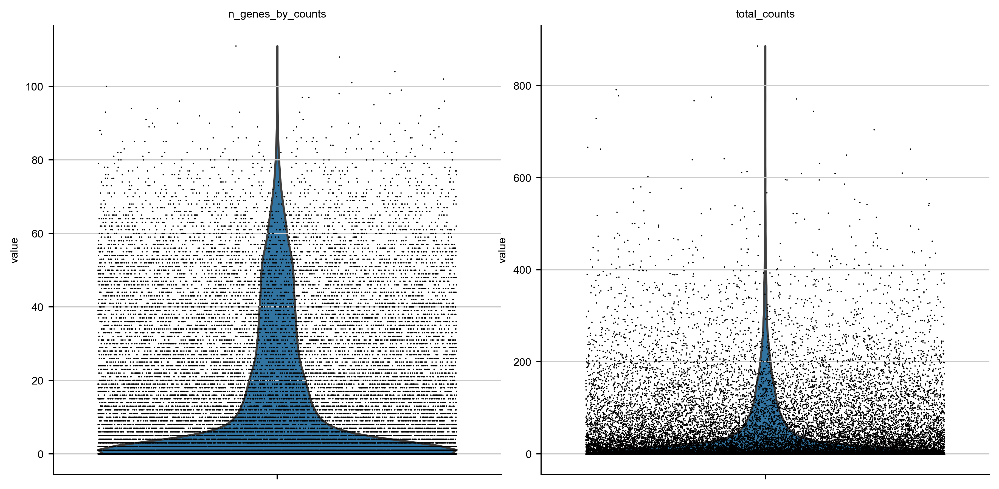

In [9]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

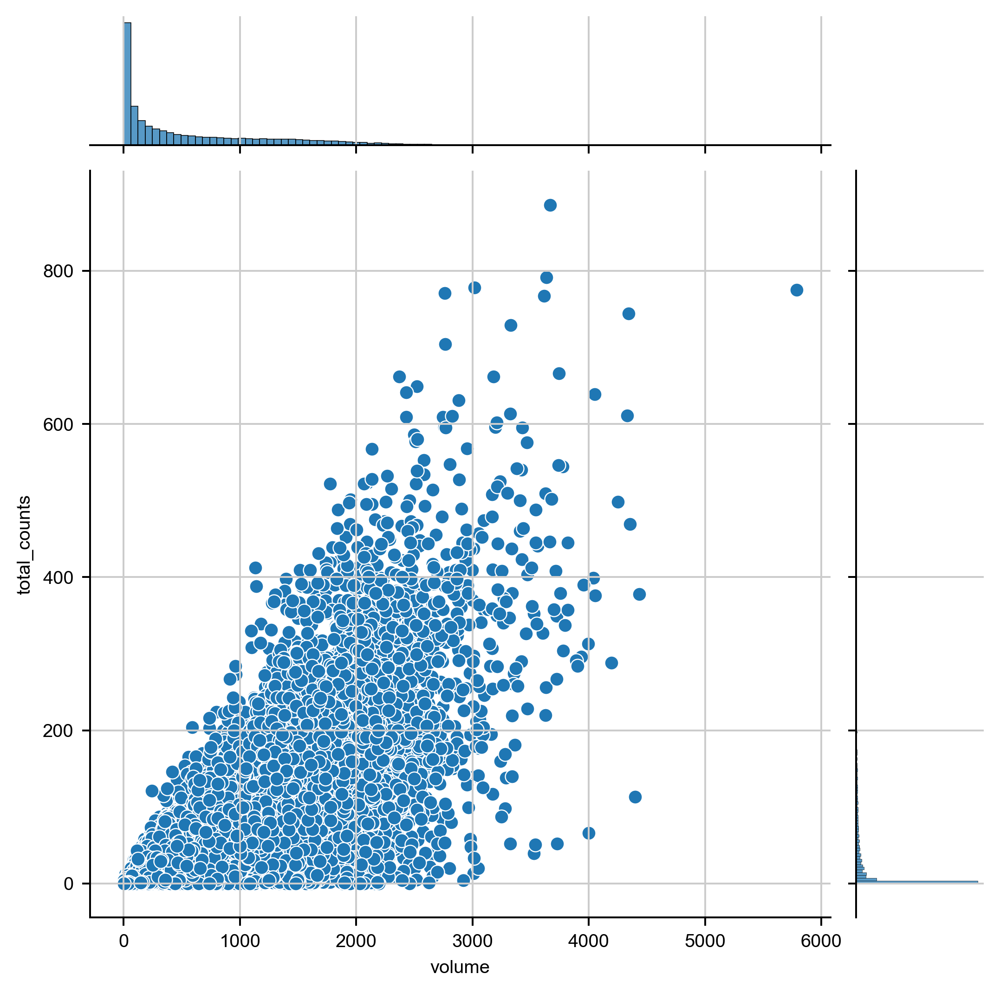

In [10]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

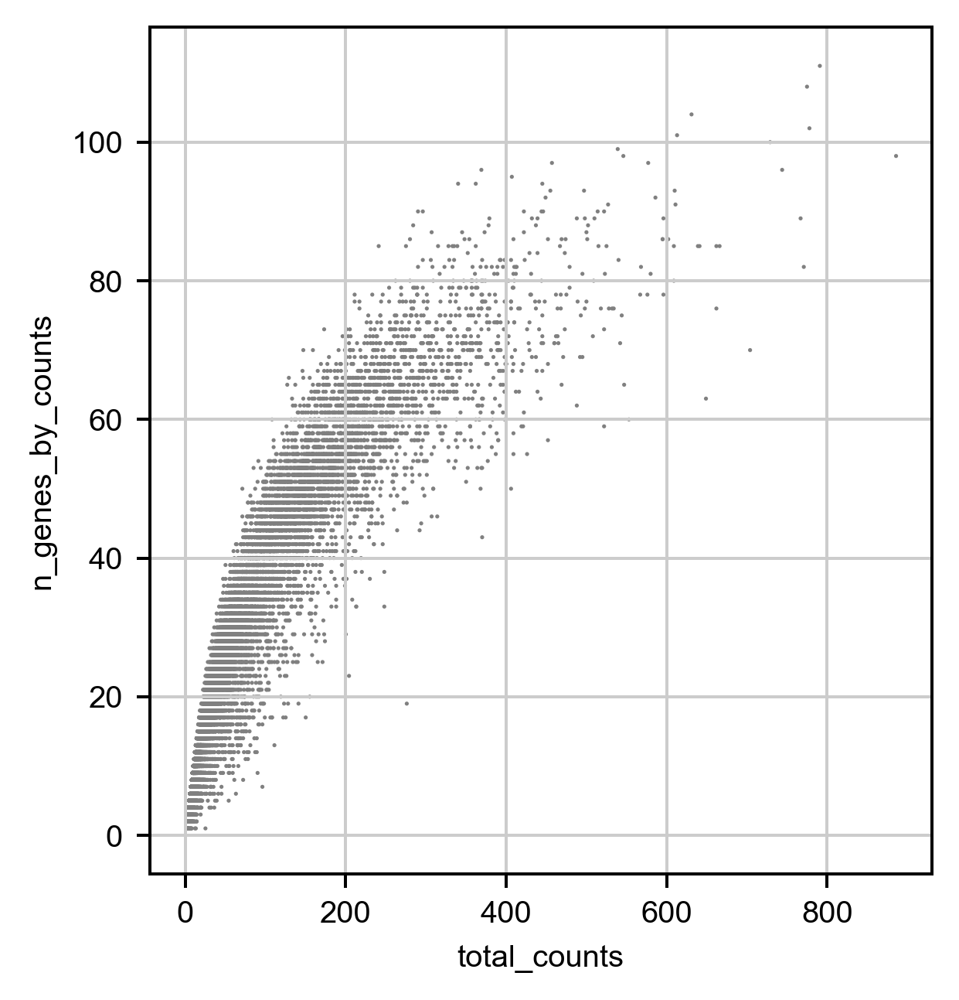

In [11]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [13]:
adata = adata[adata.obs['total_counts'] > 10]
adata = adata[adata.obs['n_genes_by_counts'] > 5]
adata = adata[adata.obs['volume'] > 100]

print(len(adata))

10579


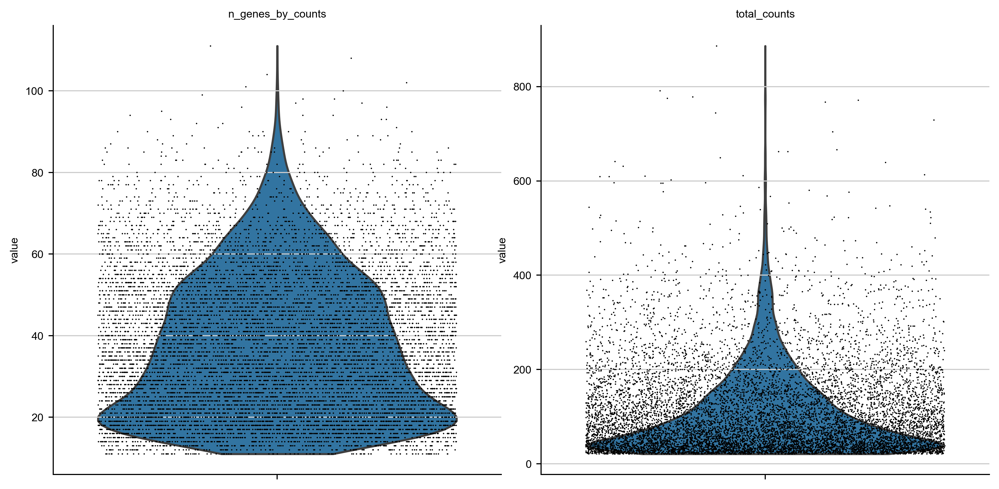

In [14]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [15]:
max(adata.obs['total_counts'])

886.0

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


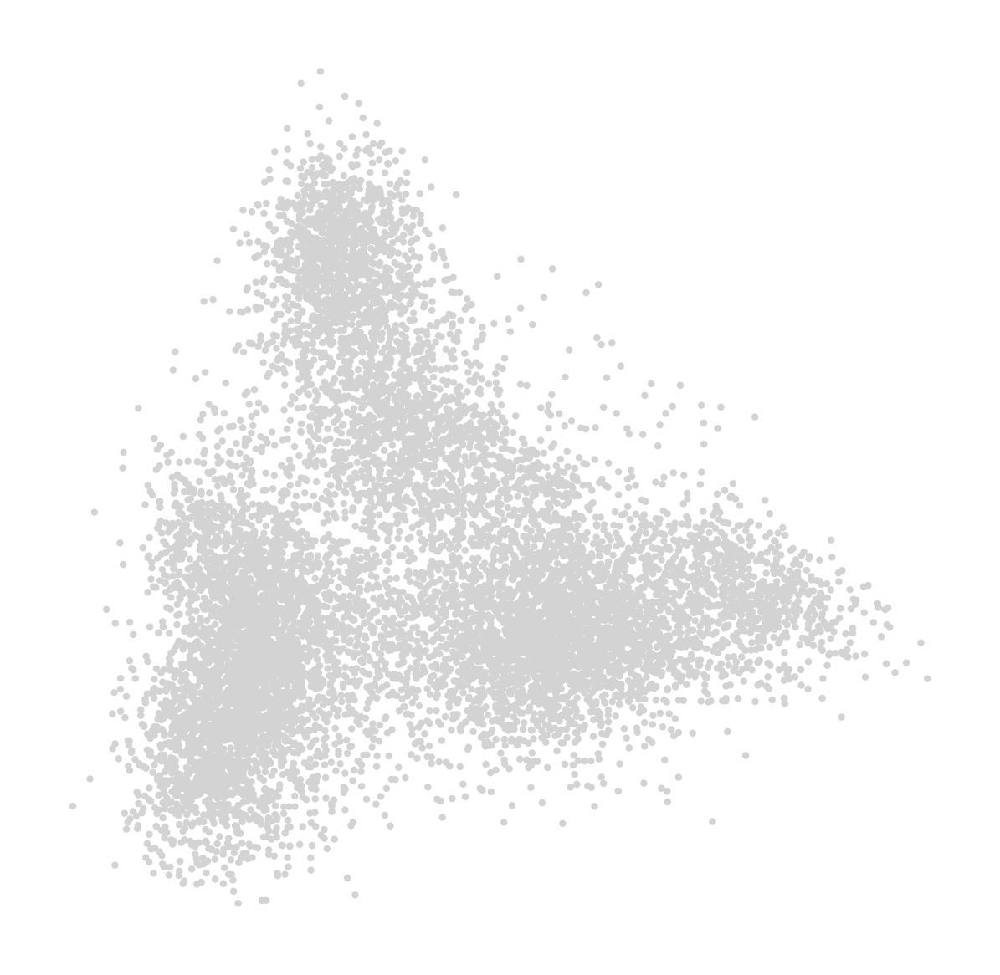

In [16]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [17]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

Wall time: 39.2 s


In [18]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=1)

Wall time: 2.43 s


The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


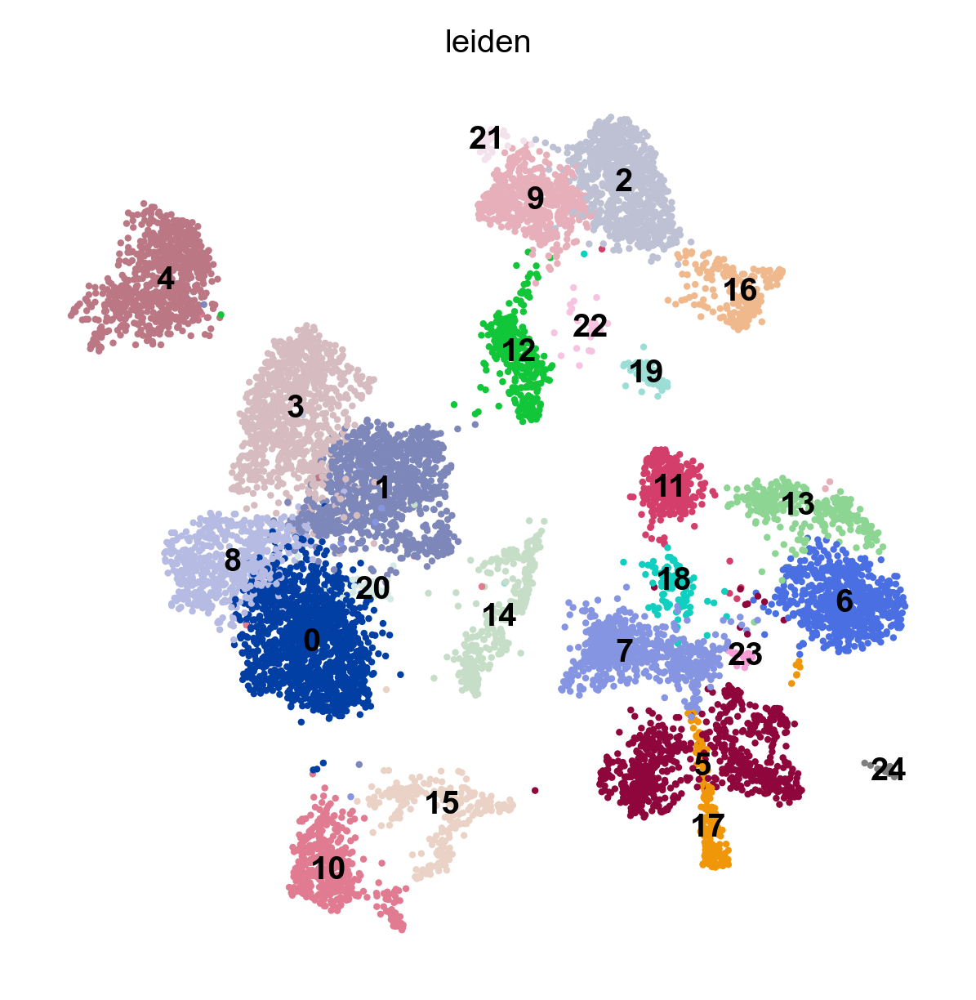

Wall time: 49.8 s


In [20]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

(-3107.0897512773054,
 5990.123708151467,
 -1488.4580486921593,
 3865.9481031021105)

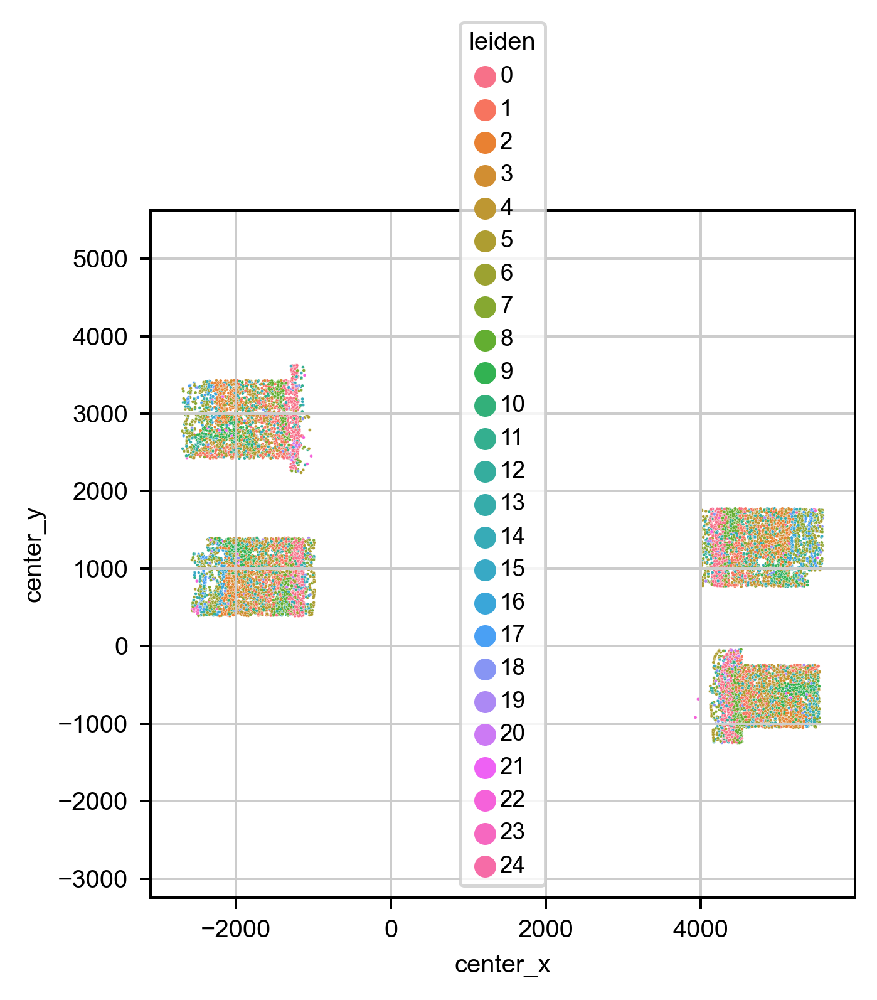

In [21]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
sns.scatterplot(data=adata.obs, x='center_x', y='center_y', hue='leiden', s=1)
plt.axis('equal')

(-3107.0897512773054,
 5990.123708151467,
 -1488.4580486921593,
 3865.9481031021105)

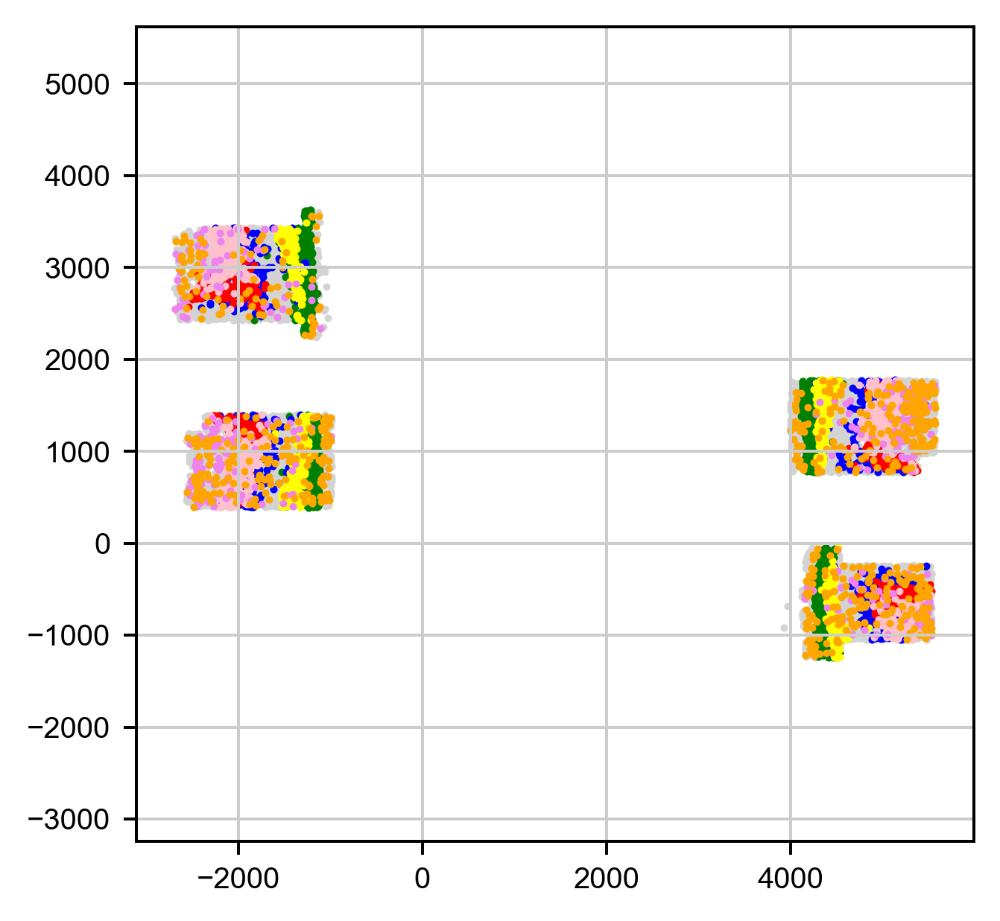

In [22]:
# can also plot a subset of clusters using their "leiden #"
import matplotlib.pyplot as plt

plt.scatter(adata.obs['center_x'], adata.obs['center_y'], c='lightgrey', s=1)


df = adata.obs[adata.obs['leiden'] == '0']
plt.scatter(df['center_x'], df['center_y'], c='green', s=1) 

df = adata.obs[adata.obs['leiden'] == '3']
plt.scatter(df['center_x'], df['center_y'], c='blue', s=1) 

#df = adata.obs[adata.obs['leiden'] == '15']
#plt.scatter(df['center_x'], df['center_y'], c='green', s=1) 


df = adata.obs[adata.obs['leiden'] == '8']
plt.scatter(df['center_x'], df['center_y'], c='yellow', s=1) 


df = adata.obs[adata.obs['leiden'] == '9'] 
plt.scatter(df['center_x'], df['center_y'], c='red', s=1)   


df = adata.obs[adata.obs['leiden'] == '2']
plt.scatter(df['center_x'], df['center_y'], c='pink', s=1) 


df = adata.obs[adata.obs['leiden'] == '13']
plt.scatter(df['center_x'], df['center_y'], c='violet', s=1) 


df = adata.obs[adata.obs['leiden'] == '7']
plt.scatter(df['center_x'], df['center_y'], c='orange', s=1) 


plt.axis('equal')

## 5. Check count for each cell for genes of interest

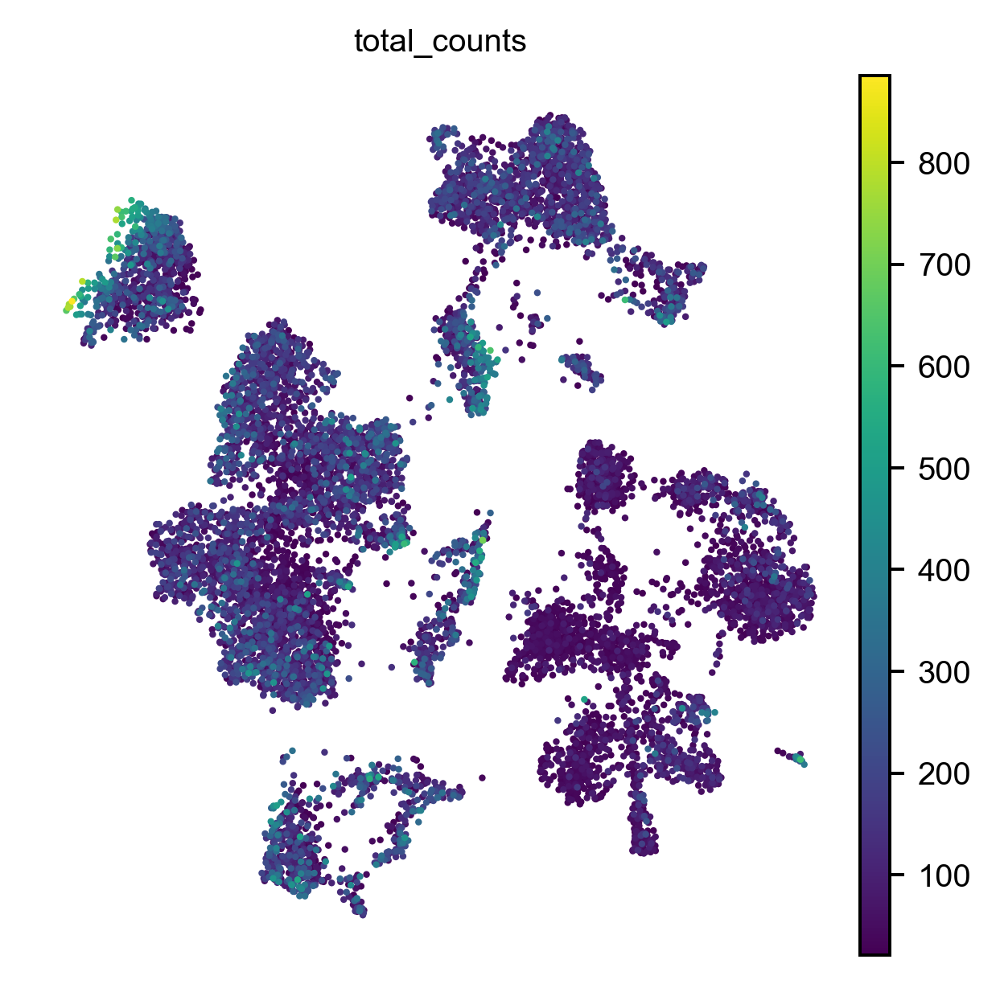

In [24]:
sc.pl.umap(adata, color='total_counts')

In [27]:
# load gene names
sel_gene_df = pd.read_excel(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-12_mop_markers\smFISH_cell_class\MOP_marker_gene_readout.xlsx',
                          )
marker_genes = [_g for _g in sel_gene_df['Target gene'].values if (_g in adata.var.index)]
print(marker_genes)

['Slc30a3', 'Slc32a1', 'Otof', 'Rspo1', 'Sncg', 'Fam84b', 'Tshz2', 'Syt6', 'Nxph4', 'Cux2', 'Rorb', 'Sulf2', 'Ptpru', 'Car3', 'Aqp4', 'Flt1', 'Igf2', 'Pdgfra', 'Sox10', 'Ctss', 'Vtn', 'Bgn']


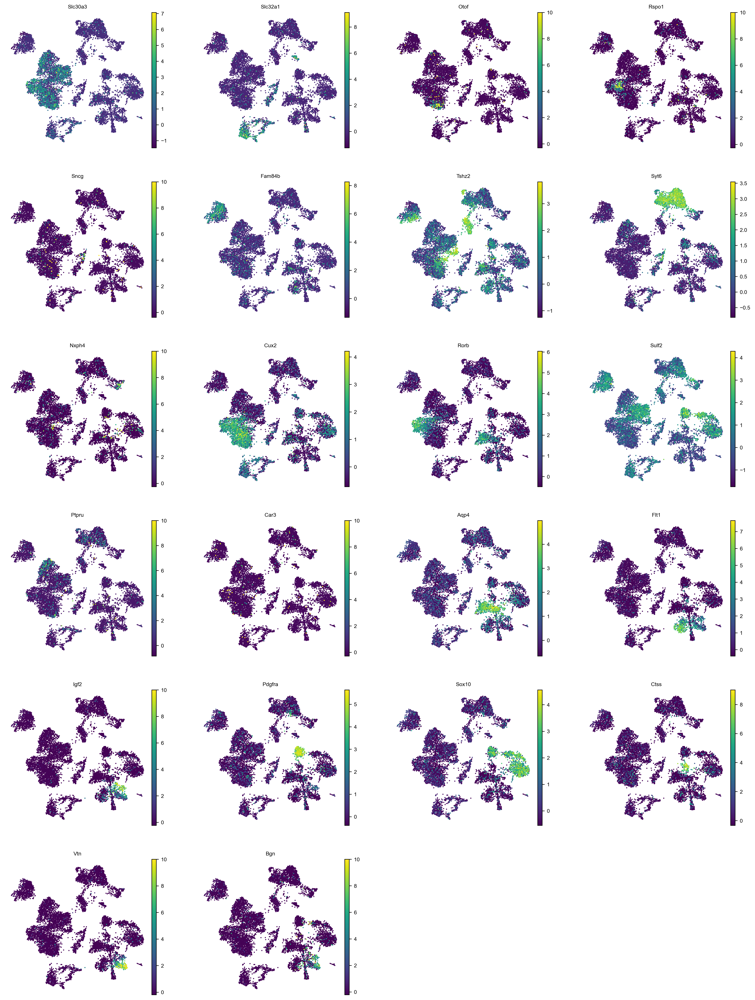

In [28]:
sc.pl.umap(adata, color=marker_genes)

## 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

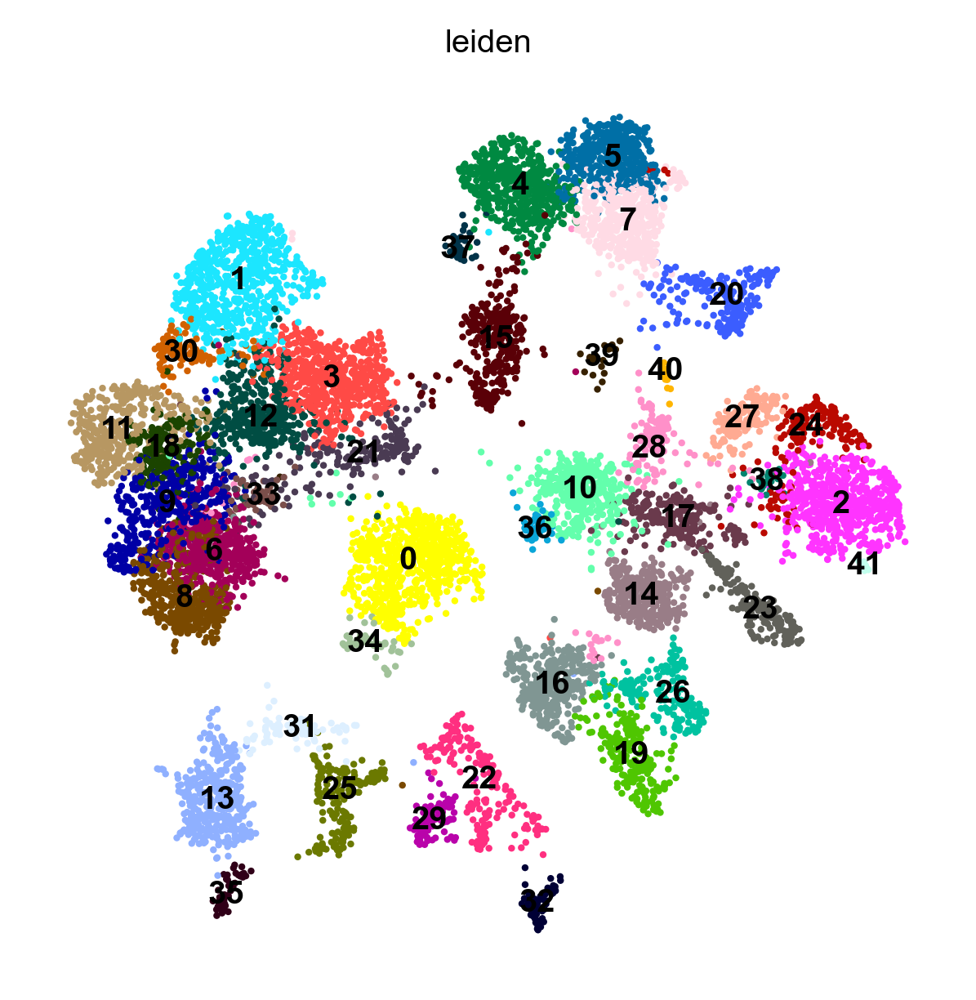

Wall time: 1min 37s


In [29]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=50)

sc.tl.leiden(adata, resolution=2)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this labels as a new column as 'leiden_cluster'
adata.obs['leiden_cluster'] = adata.obs.leiden

## 6.2 Use lower expected pcs and resolution to UMAP for cell-type distinction at subclass level

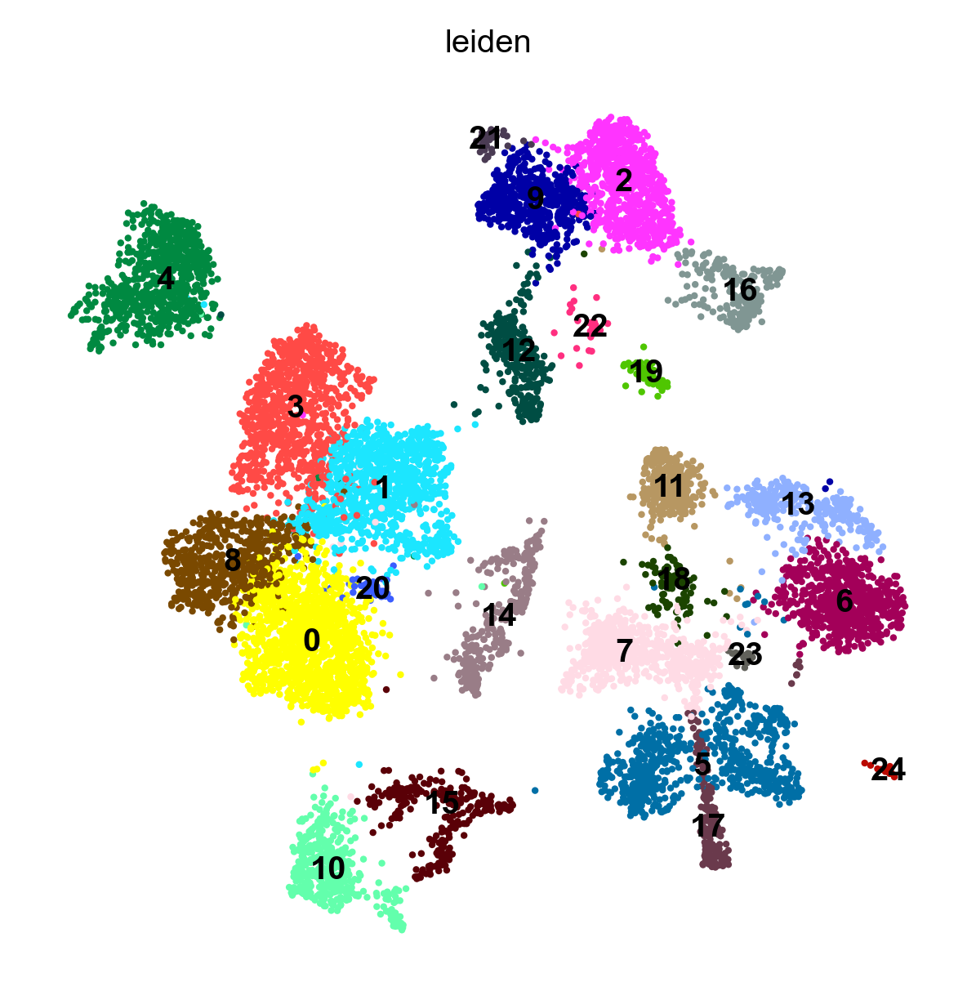

Wall time: 54.5 s


In [30]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

sc.tl.leiden(adata, resolution=1)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this new labels as a new column as 'leiden_subclass'
adata.obs['leiden_subclass'] = adata.obs.leiden

## 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [34]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = False

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: \\mendel\Mendel_SSD1\Pu_Temp\20220208MO4_nonclear\filtered_cluster_data.h5ad


'\\\\crick\\SSD_0\\Shiwei\\Analysis\\20220208MO4_nonclear_PostAnalysis'